In [1]:
import sys 
sys.path.append("C:/Users/L2S/Desktop/Efficient_and_reliable_GP/")


from Code.data_generation      .samplers                               import sampler, extract_K_samples
from Code.gaussian_processes   .gaussian_process                       import GaussianProcessModel
from Code.gaussian_processes   .gaussian_process_evaluation            import GaussianProcessModelEvaluation
from Code.results_visualization.results_visualization                  import ResultsVisualization
from Code.Parameters           .sampler_parameters                     import sampler_parameters
from Code.Parameters           .visualization_parameters               import visualization_parameters
from Code.Parameters           .gaussian_process_parameters            import gaussian_process_model_parameters
from Code.Parameters           .gaussian_process_evaluation_parameters import gaussian_process_model_evaluation_parameters

### Dataset generation

In [2]:
N_function                        = 100
N_train                           = 5
N_test                            = 3
function_name                     = "Power sinus 1D"
function_X, function_Y            = sampler          (N_function, function_name, sampler_parameters)
X         , Y                     = extract_K_samples(function_X, function_Y, N_train + N_test)
train_X   , train_Y               = X[:N_train], Y[:N_train]
test_X    , test_Y                = X[N_train:], Y[N_train:]

### Gaussian process regression

In [3]:
gaussian_process_model            = GaussianProcessModel(train_X, train_Y, gaussian_process_model_parameters)
gaussian_process_model.train()

### Gaussian process evaluation

In [4]:
gaussian_process_model_evaluation = GaussianProcessModelEvaluation(train_X, train_Y, test_X, test_Y, function_X, function_Y, gaussian_process_model, gaussian_process_model_evaluation_parameters)
evaluation                        = gaussian_process_model_evaluation.evaluation()

# Results visualization

In [5]:
results_visualization             = ResultsVisualization(function_name, sampler_parameters, gaussian_process_model, evaluation, visualization_parameters)

In [6]:
log_scale                         = False

# 1 - Gaussian process training

### 1.1 - Hyperparameters optimization history

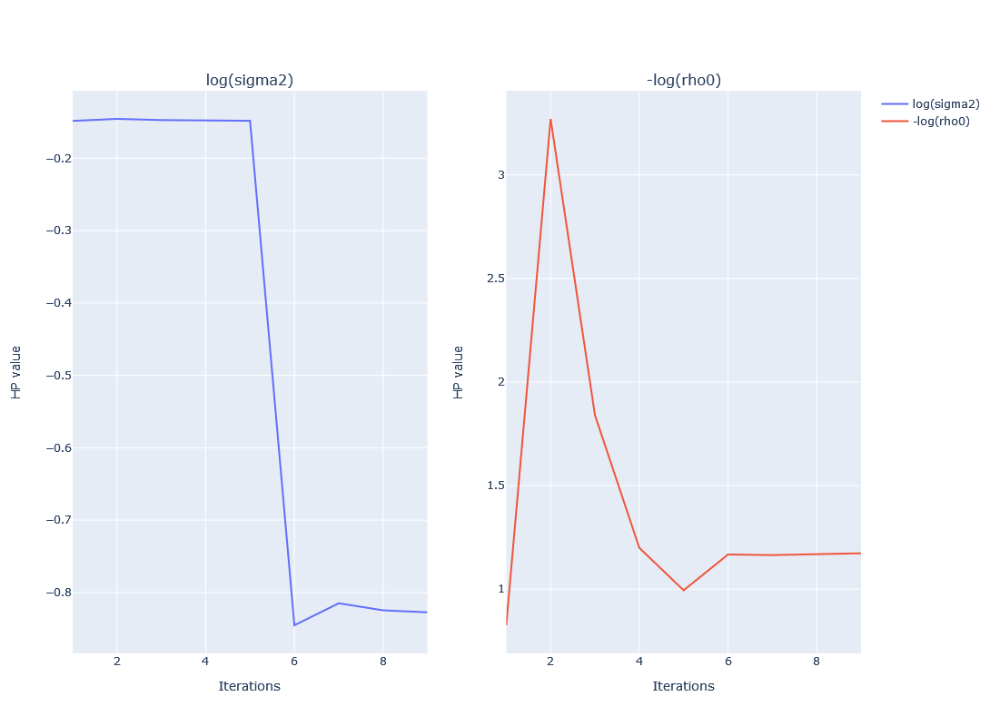

In [7]:
results_visualization.plot_hyperparameters_optimization_history()

### 1.2 - Criterion history

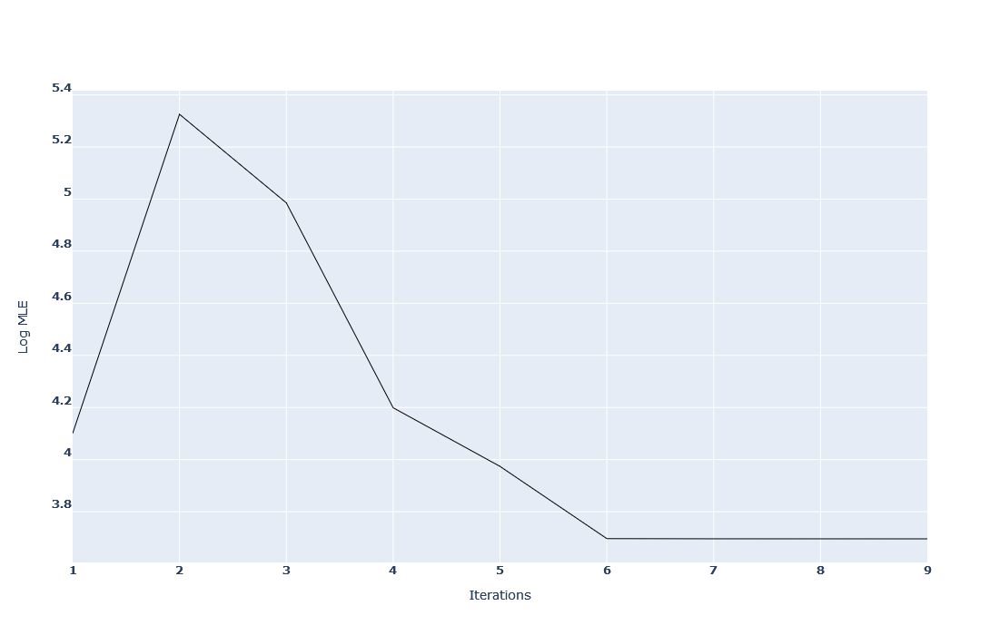

In [8]:
results_visualization.plot_criterion_history()

### 1.3 - Negative log-likelihood evolution

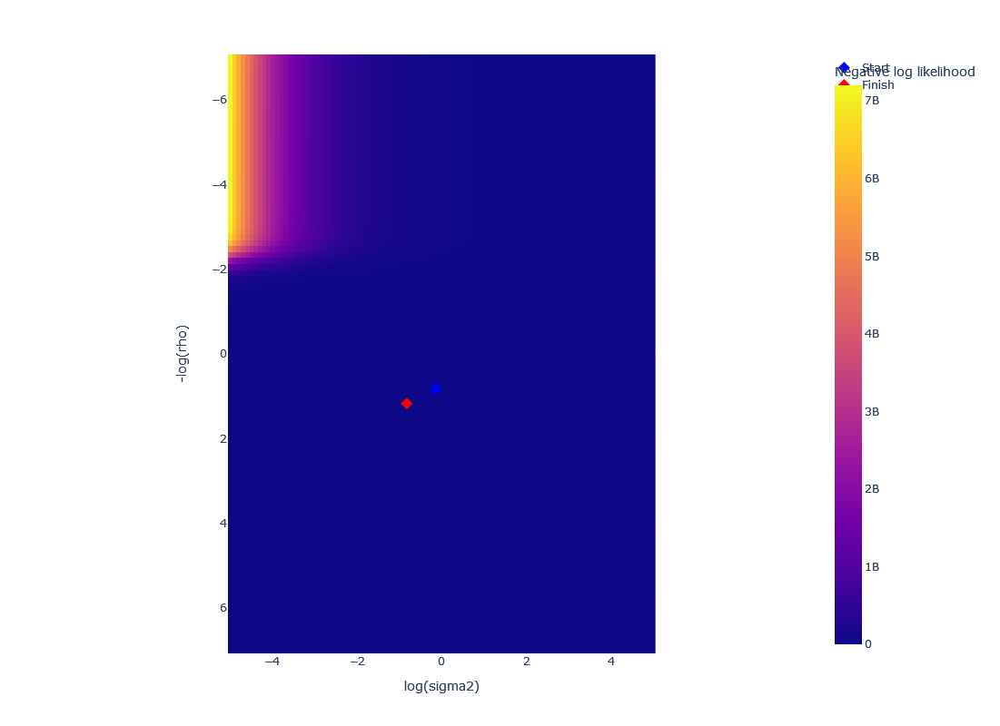

In [9]:
results_visualization.plot_negative_log_likelihood_evolution             (log_scale)

### 1.4 - Profiled negative log-likelihood evolution

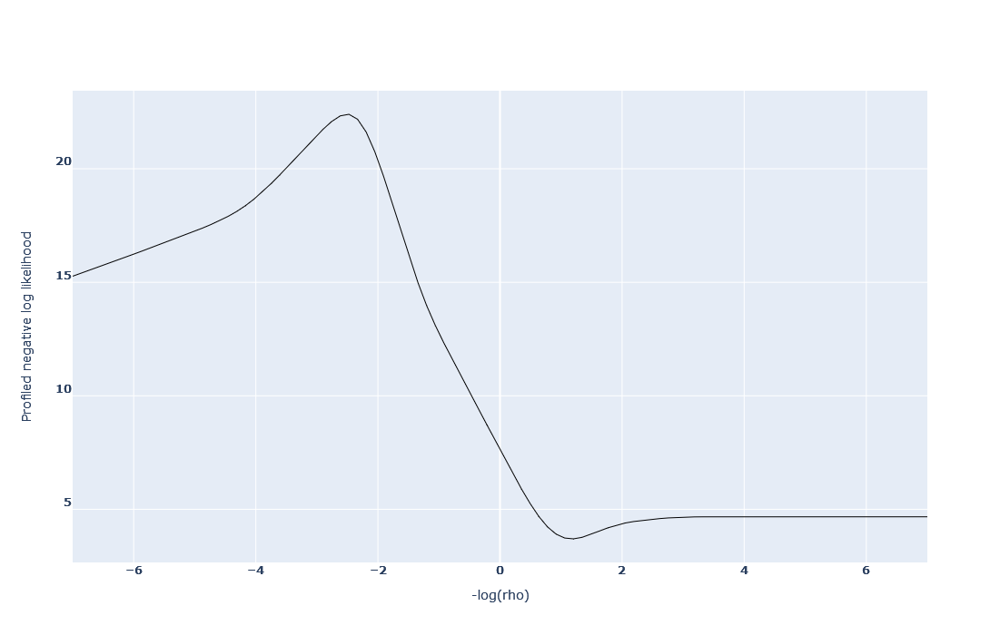

In [10]:
results_visualization.plot_profiled_negative_log_likelihood_evolution    (log_scale)

### 1.5 - Profiled PVA negative log-likelihood evolution

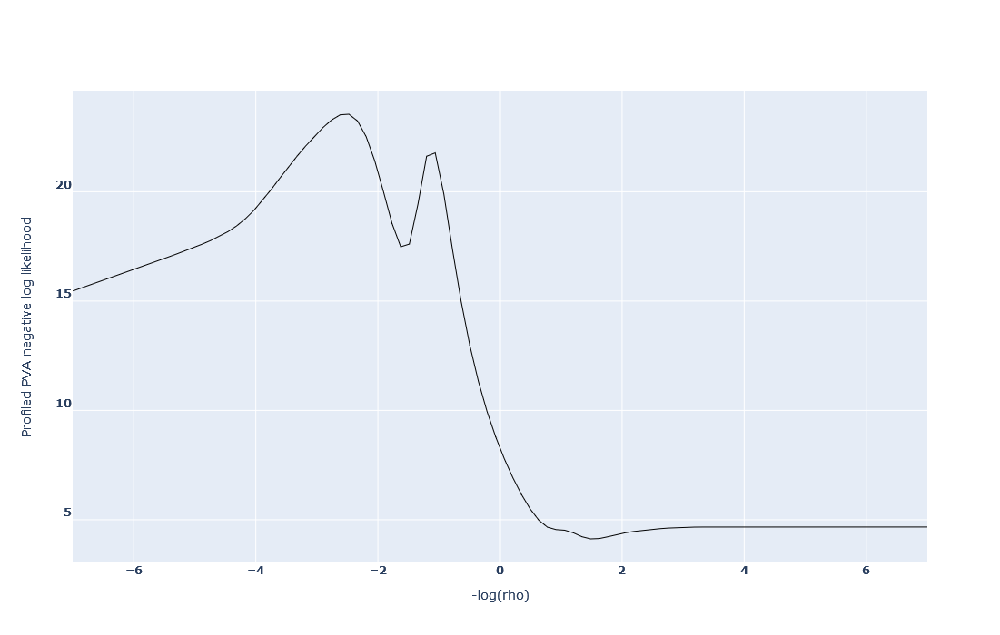

In [11]:
results_visualization.plot_profiled_pva_negative_log_likelihood_evolution(log_scale)

### 1.6 - Mean square error evolution

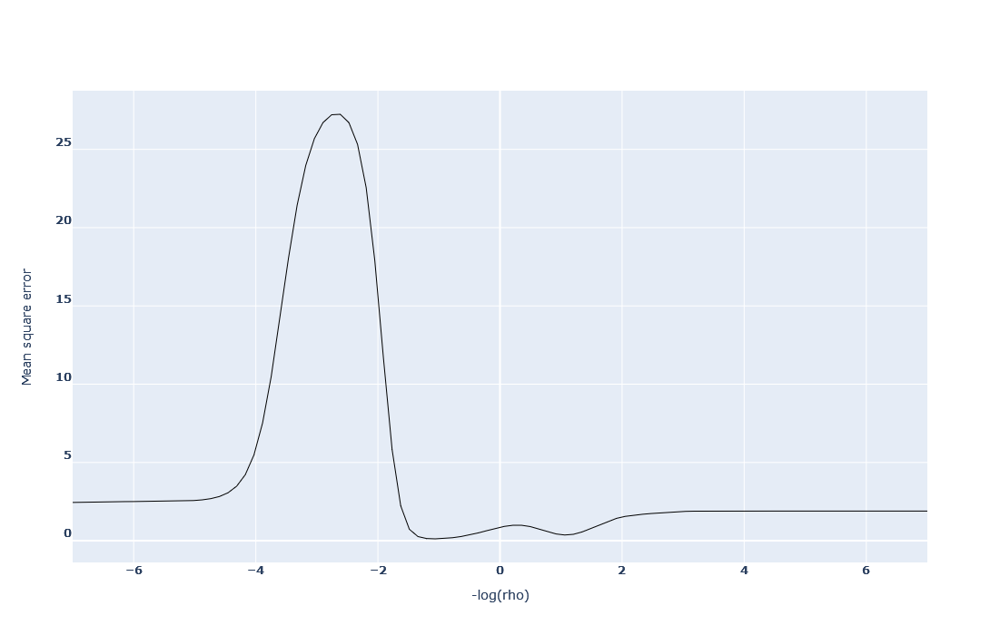

In [12]:
results_visualization.plot_mean_square_error_evolution                   (log_scale)

# 2 - Predictions

### 2.1 - Function predictions

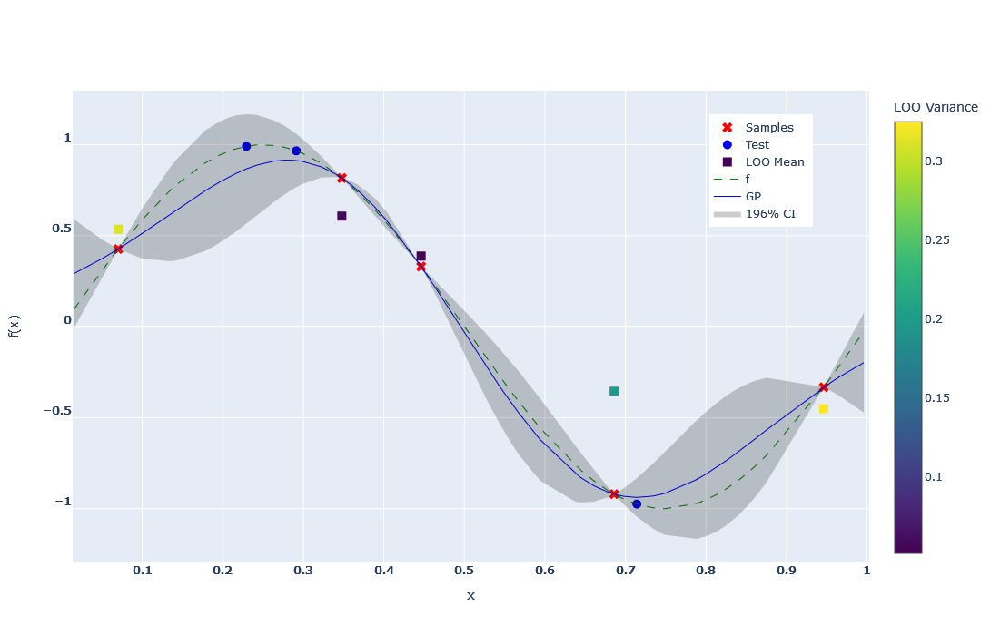

In [13]:
results_visualization.plot_function_predictions()

### 2.2 - Truth vs predictions

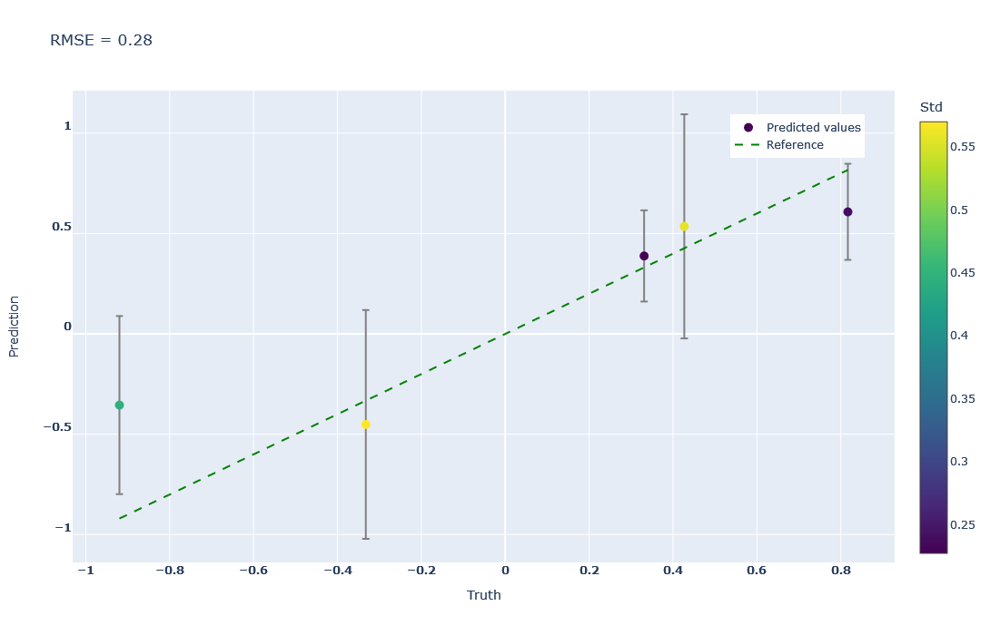

In [14]:
results_visualization.plot_truth_vs_predictions                                          ("Train")

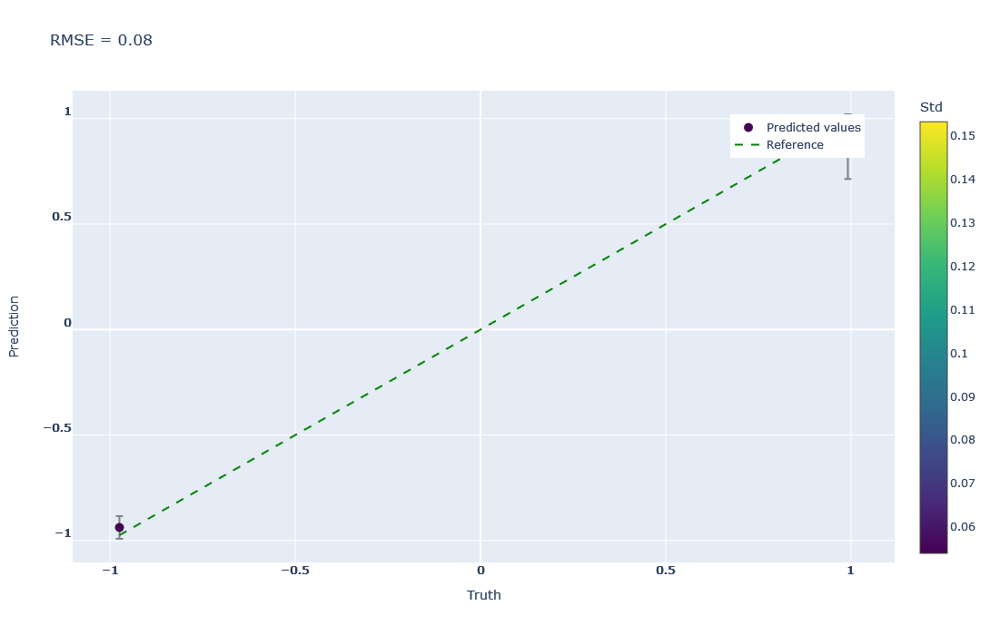

In [15]:
results_visualization.plot_truth_vs_predictions                                          ("Test" )

# 3 - Reliability

### 3.1 - Empirical coverage probability assuming reliability

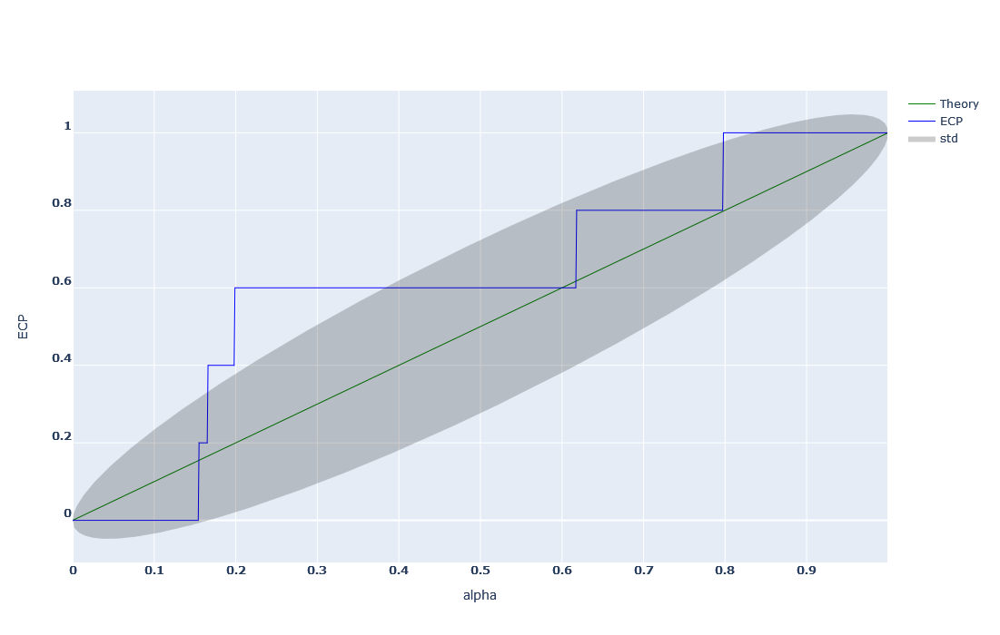

In [16]:
results_visualization.plot_empirical_coverage_probability_assuming_reliability           ("Train")

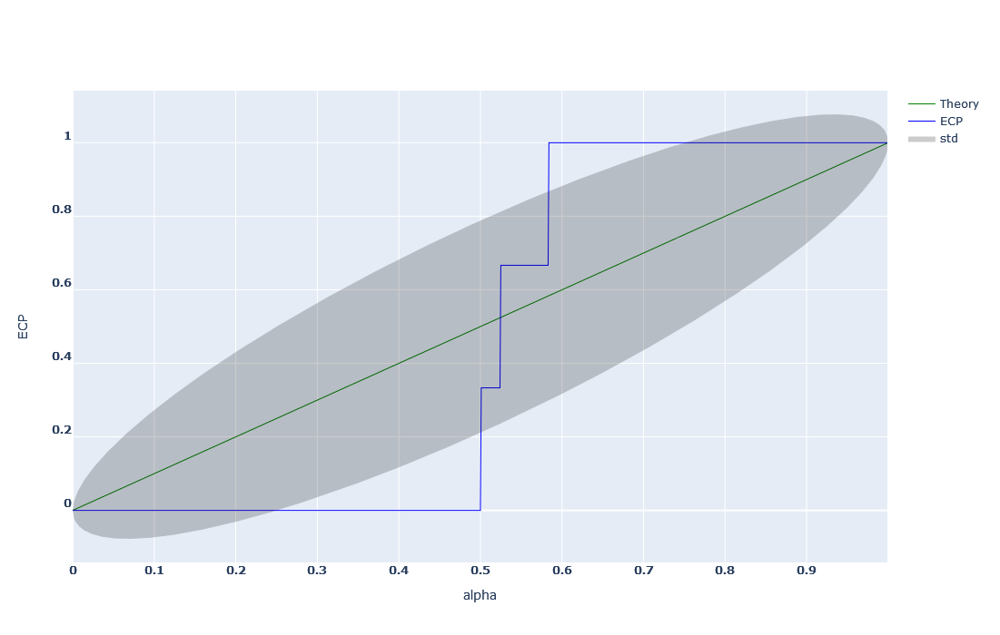

In [17]:
results_visualization.plot_empirical_coverage_probability_assuming_reliability           ("Test" )

### 3.2 - Predictive variance adequacy assuming reliability

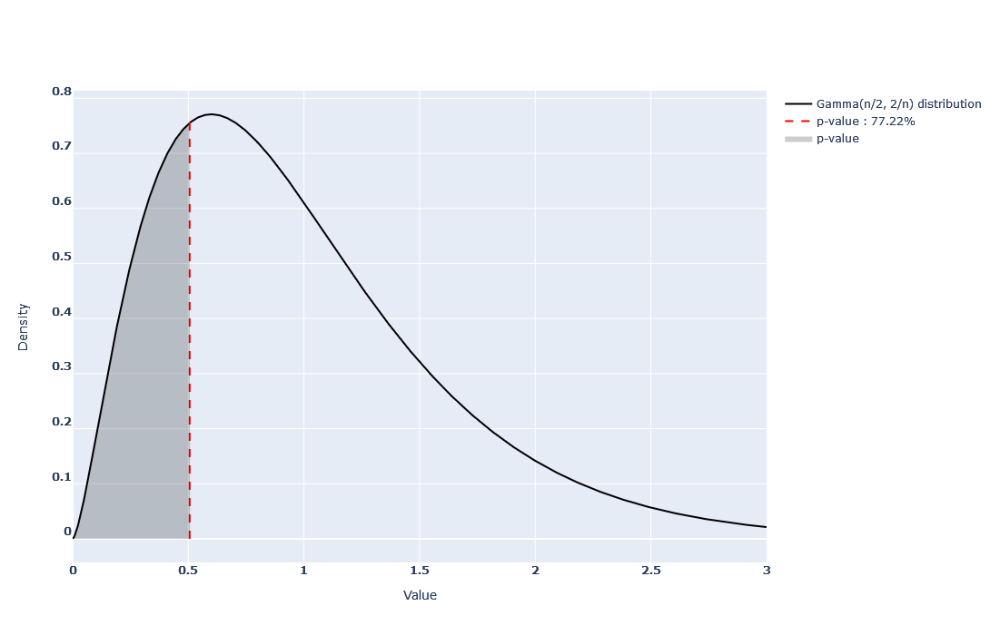

In [18]:
results_visualization.plot_predictive_variance_adequacy_distribution_assuming_reliability("Train")

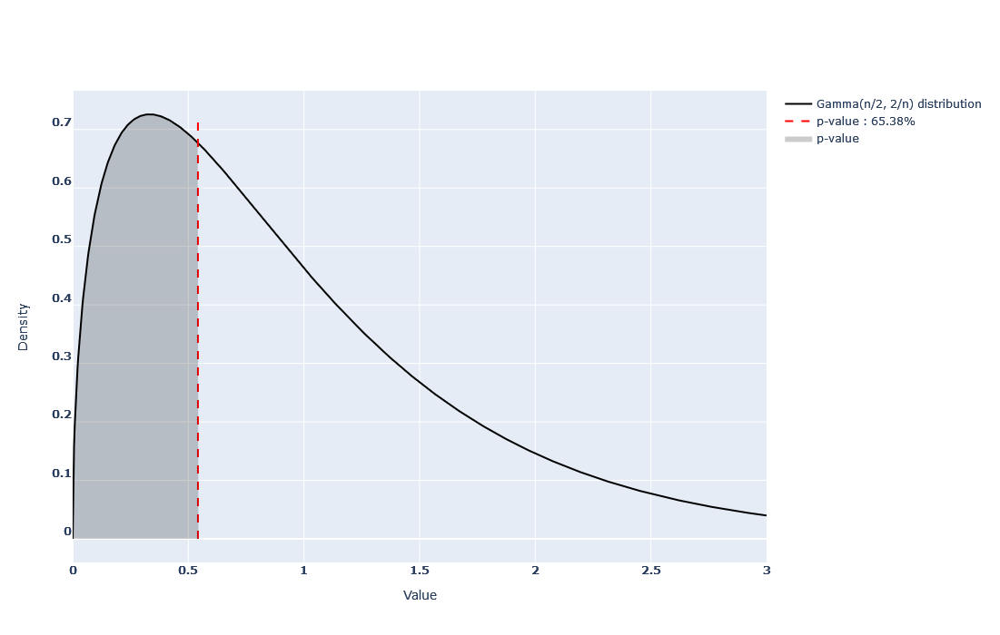

In [19]:
results_visualization.plot_predictive_variance_adequacy_distribution_assuming_reliability("Test" )

### 3.3 - Normalized prediction errors

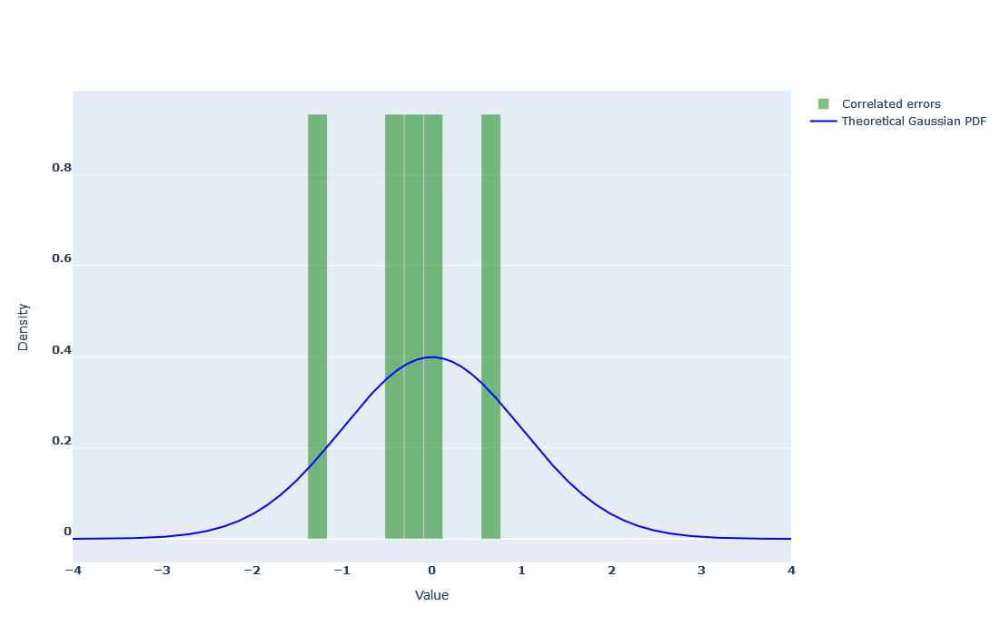

In [20]:
results_visualization.plot_normalized_prediction_errors                                  ("Train")

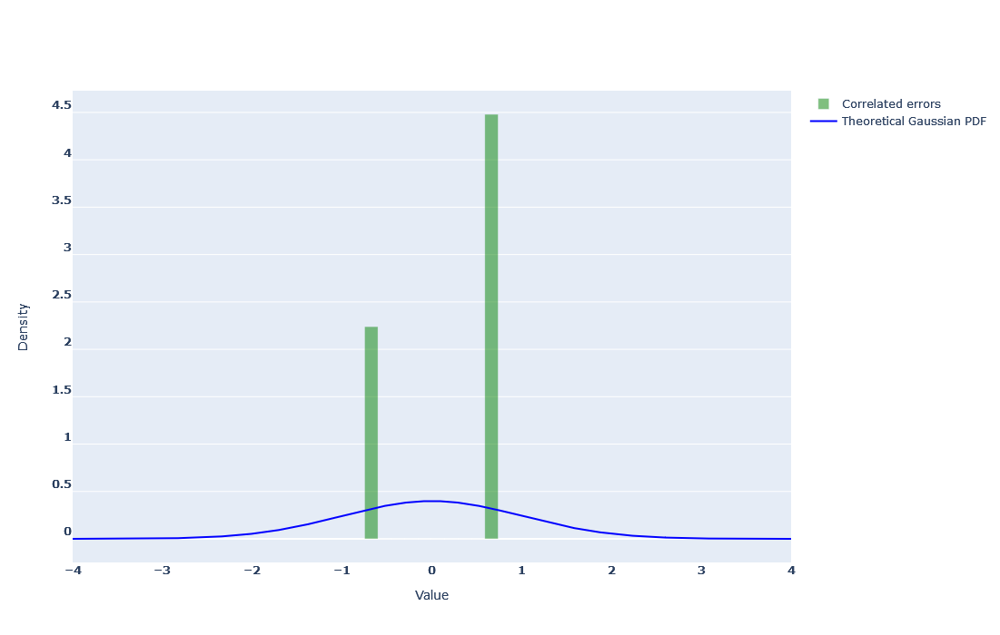

In [21]:
results_visualization.plot_normalized_prediction_errors                                  ("Test" )

# 4 - Gaussianity

### 4.1 - Whitened data assuming Gaussianity

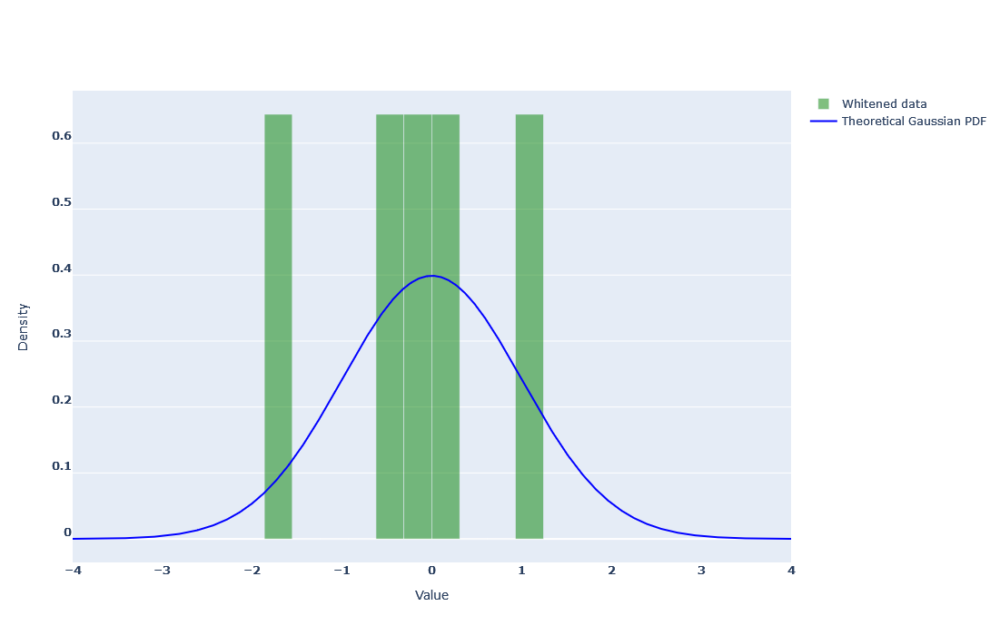

In [22]:
results_visualization.plot_whitened_data_assuming_gaussianity                            ("Train")

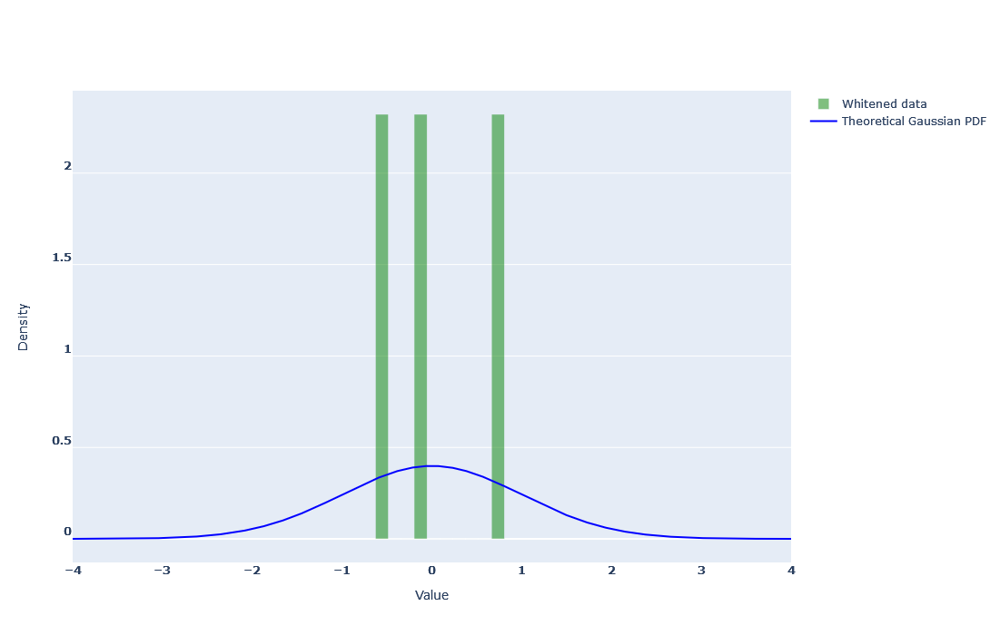

In [23]:
results_visualization.plot_whitened_data_assuming_gaussianity                            ("Test" )

### 4.2 - Mahalanobis distance distribution assuming Gaussianity

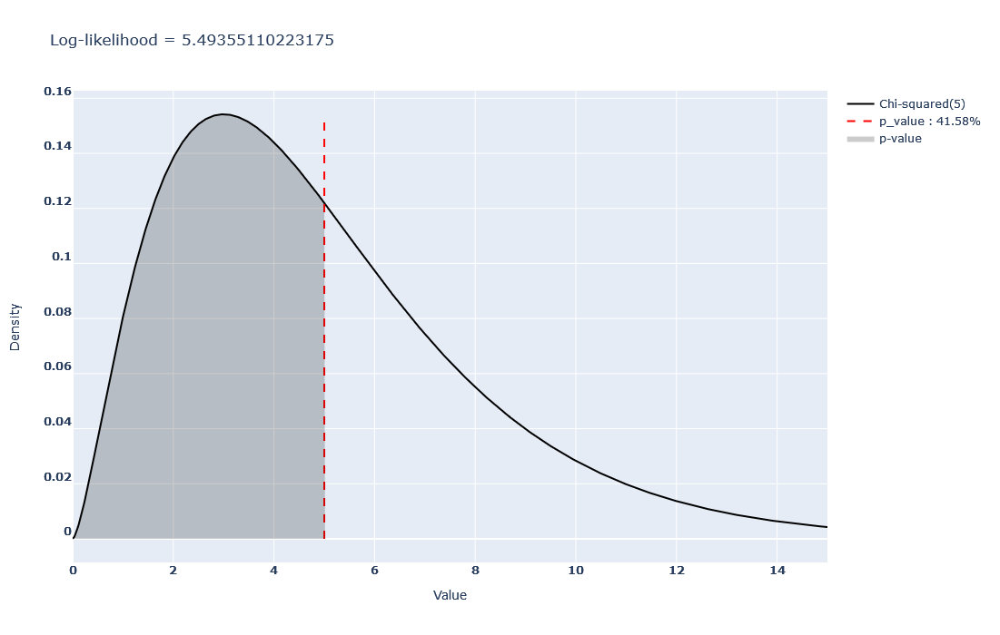

In [24]:
results_visualization.plot_mahalanobis_distance_distribution_assuming_gaussianity        ("Train")

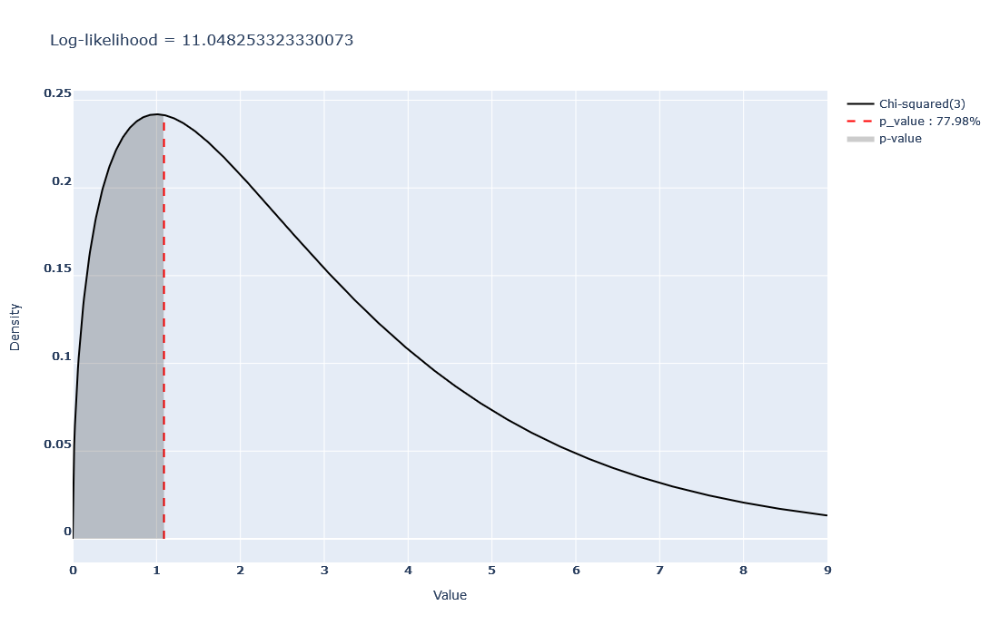

In [25]:
results_visualization.plot_mahalanobis_distance_distribution_assuming_gaussianity        ("Test" )

### 4.3 - Equivalent normal observation assuming Gaussianity

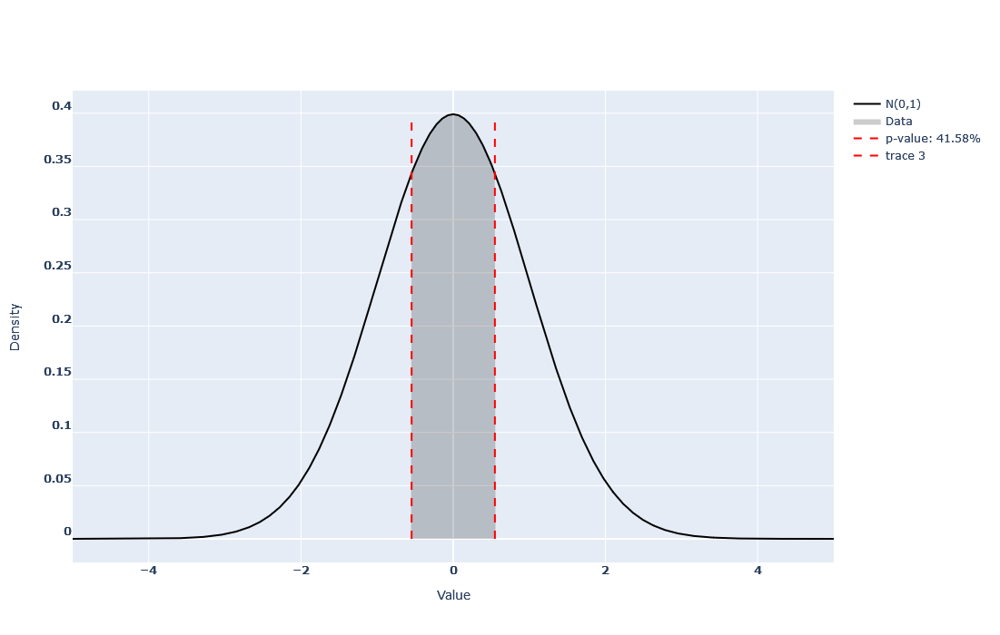

In [26]:
results_visualization.plot_equivalent_normal_observation_assuming_gaussianity            ("Train")

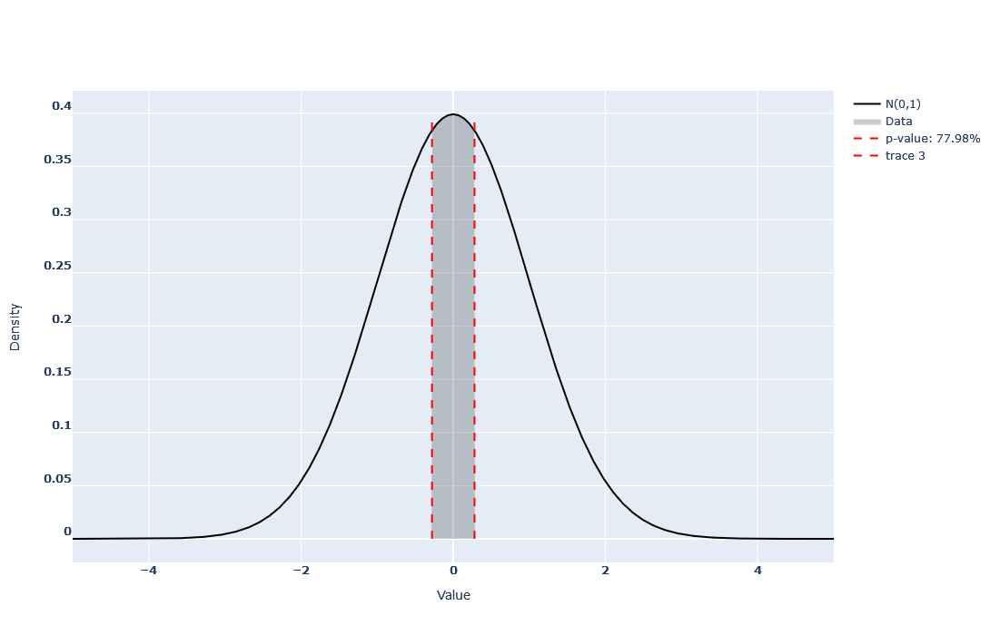

In [27]:
results_visualization.plot_equivalent_normal_observation_assuming_gaussianity            ("Test" )

### 4.4 - Predictive variance adequacy distribution assuming Gaussianity

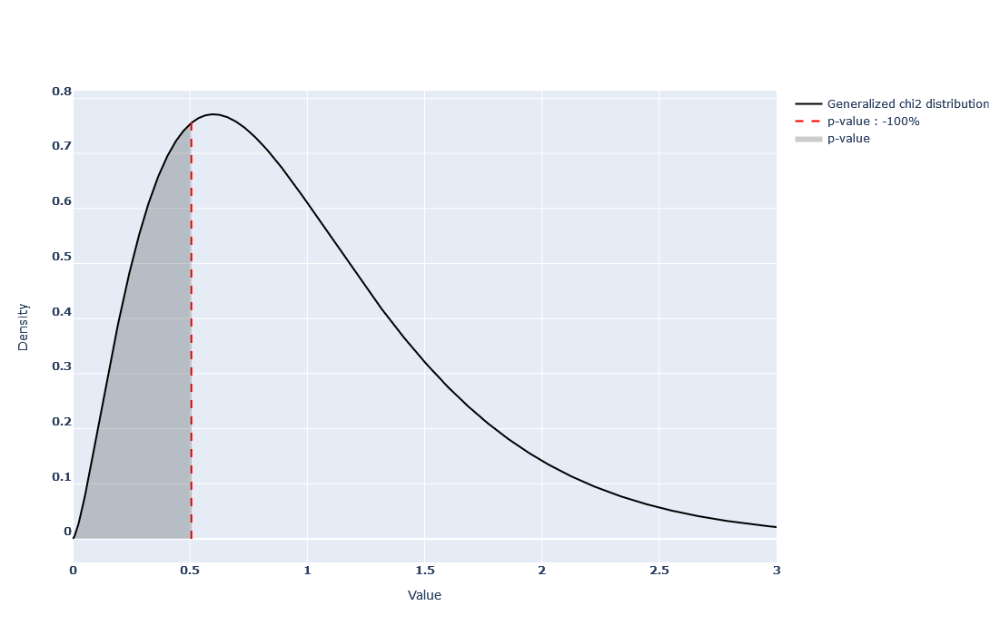

In [28]:
results_visualization.plot_predictive_variance_adequacy_assuming_gaussianity             ("Train")

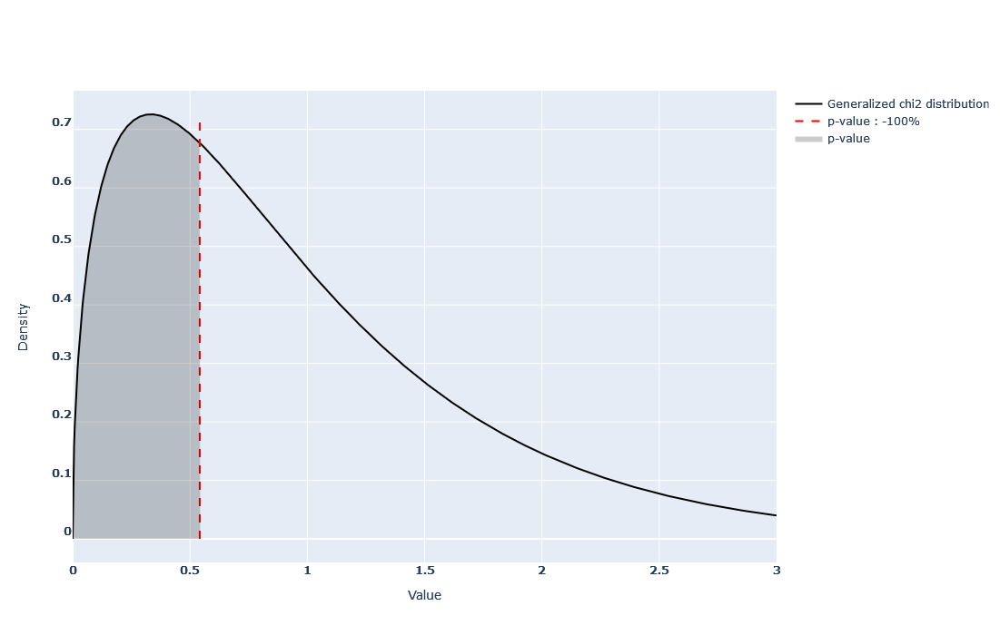

In [29]:
results_visualization.plot_predictive_variance_adequacy_assuming_gaussianity             ("Test" )

### 4.5 - Independent normalized prediction errors assuming Gaussianity

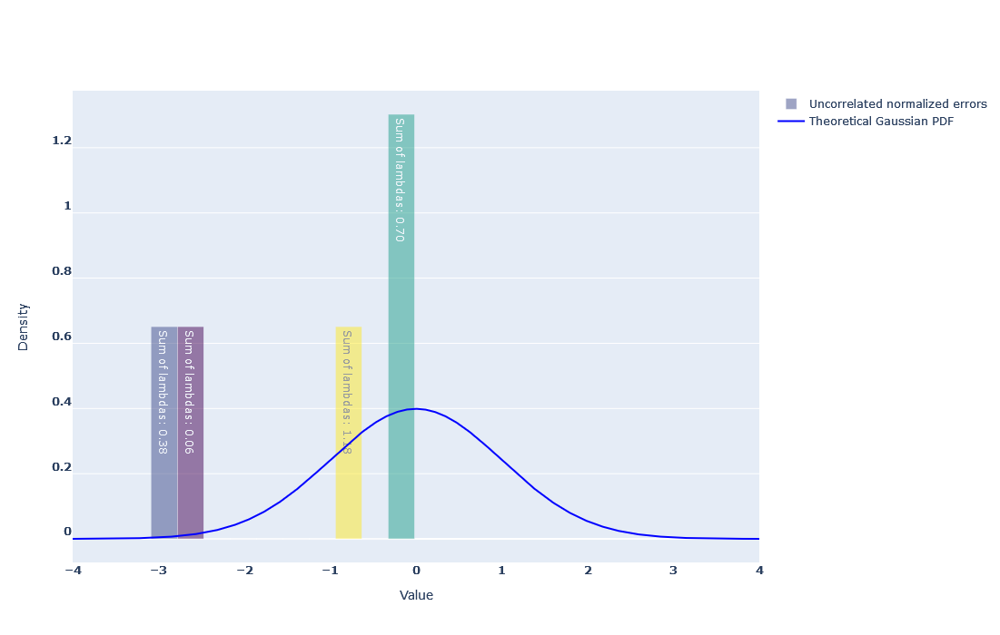

In [30]:
results_visualization.plot_normalized_prediction_errors_uncorrelated_assuming_gaussianity("Train")

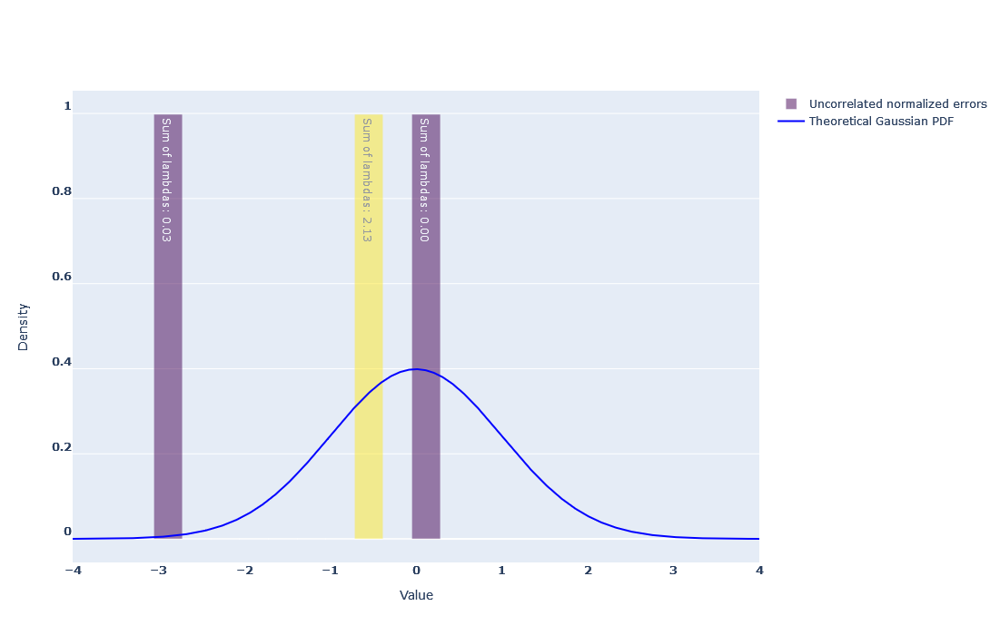

In [31]:
results_visualization.plot_normalized_prediction_errors_uncorrelated_assuming_gaussianity("Test" )

### 4.6 - Lambdas empirical distribution

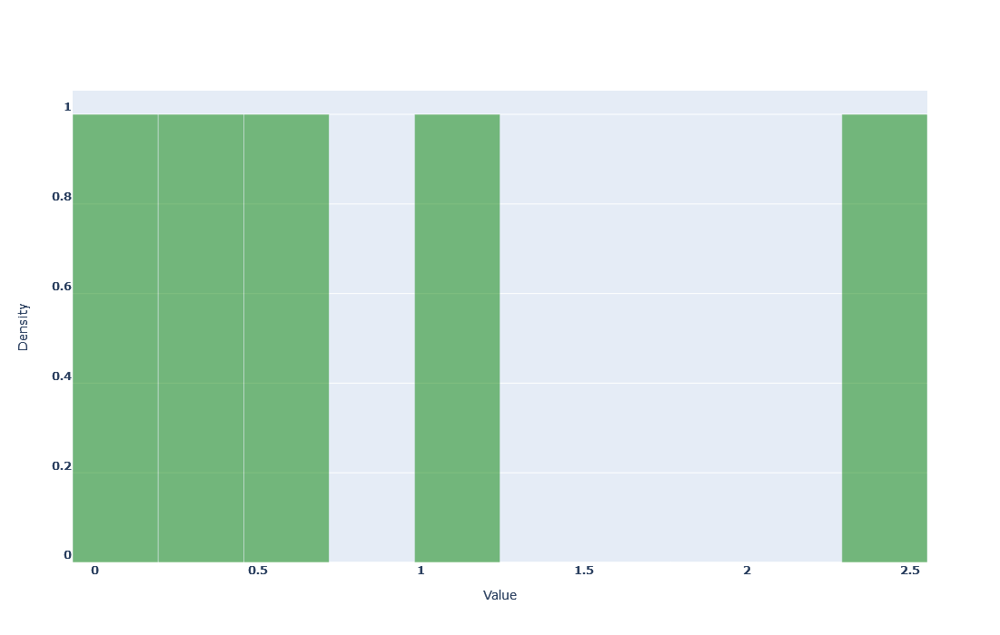

In [32]:
results_visualization.plot_lambdas_empirical_distribution                                ("Train")

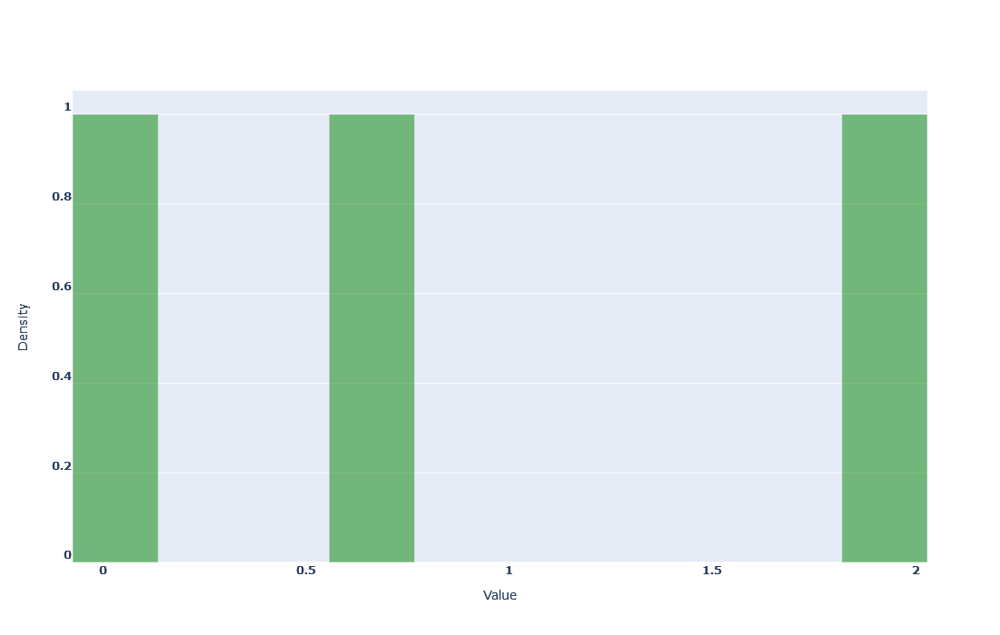

In [33]:
results_visualization.plot_lambdas_empirical_distribution                                ("Test" )

# 5 - Metrics

### 5.1 - Reliability

In [34]:
results_visualization.show_reliability_metrics                                           ("Train")

PVA       : 0.5057175917852205 - n = 5
95% ECP : 1.0
IAE       : 0.137476
PMIW      : 0.4077162073553513


In [35]:
results_visualization.show_reliability_metrics                                           ("Test" )

PVA       : 0.5415383084653267 - n = 3
95% ECP : 1.0
IAE       : 0.22293333333333334
PMIW      : 7.688574130850415


### 9.2 - Performance

In [36]:
results_visualization.show_performance_metrics                                           ("Train")

RMSE : 0.2800858618700056
Q2   : 0.793010969004365


In [37]:
results_visualization.show_performance_metrics                                           ("Test" )

RMSE : 0.08095445420349777
Q2   : 0.9922741296274153


### 9.3 - Hybrid

In [38]:
results_visualization.show_hybrid_metrics                                                ("Train")

NLPD     : -0.7209587022203187
CRPS     : 0.16453415112288272
95% IS : 7.057954134926039


In [39]:
results_visualization.show_hybrid_metrics                                                ("Test" )

NLPD     : -2.1924815101598267
CRPS     : 0.04271230422118713
95% IS : 0.7164251123841381
